In [ ]:
!pip install rasterio spectral earthpy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 36.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.9/212.9 kB 19.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 58.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 60.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 61.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 43.0 MB/s eta 0:00:00


gustavo jajsfjasfjasf


In [ ]:
# Bibliotecas
import numpy as np
import rasterio as rio
from rasterio.plot import reshape_as_image, show
from spectral import imshow
import earthpy.plot as ep
import matplotlib
import matplotlib.pyplot as plt

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Configurando o tamanho das imagens na janela de output
matplotlib.rcParams['figure.figsize'] = (15,10)

In [ ]:
#Função de expansão
def expansao(img, percent_ini=2, percent_fim=98, x=0, y=255):
    s = np.zeros_like(img)  
    w = np.percentile(img, percent_ini)
    z = np.percentile(img, percent_fim)        
    p = x + (img - w) * (y - x) / (z - w)    
    p[p<x] = x
    p[p>y] = y
    s = p
    return s

In [ ]:
# Leitura da imagem
src = rio.open('L71221071_07120010720_DN.tif')
dataset = src.read()
img = reshape_as_image(dataset)

In [ ]:
type(src)

rasterio.io.DatasetReader

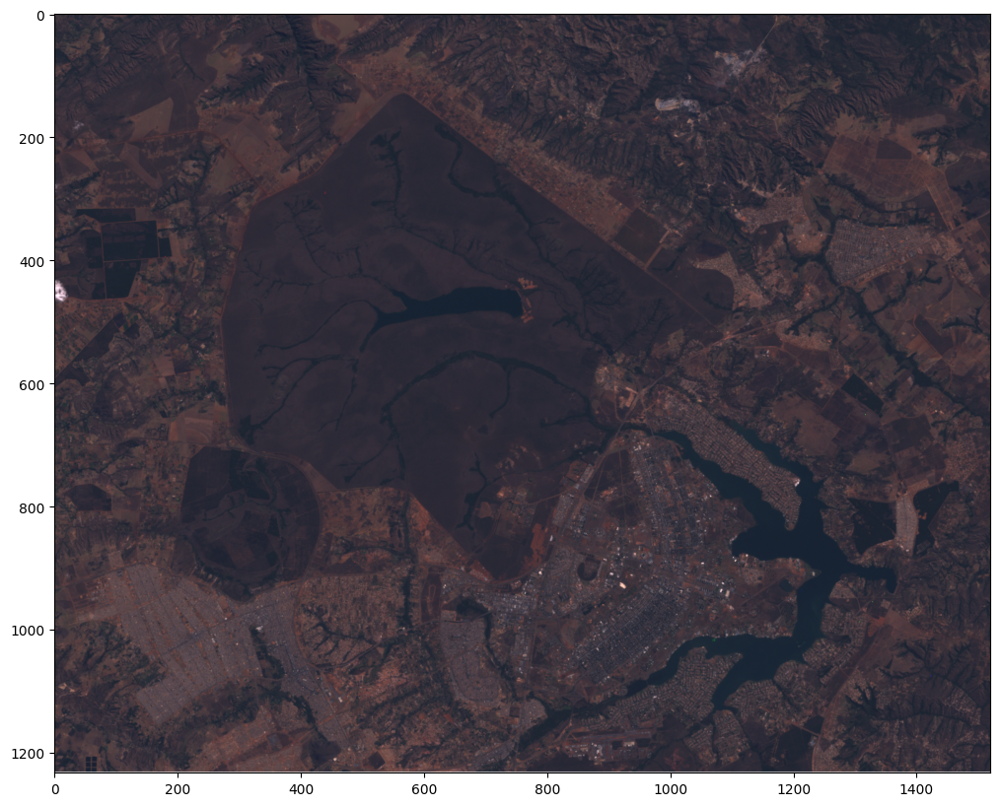

In [ ]:
plt.imshow(np.dstack([img[:,:,2],img[:,:,1],img[:,:,0]]))

In [ ]:
img.shape

(1233, 1520, 6)

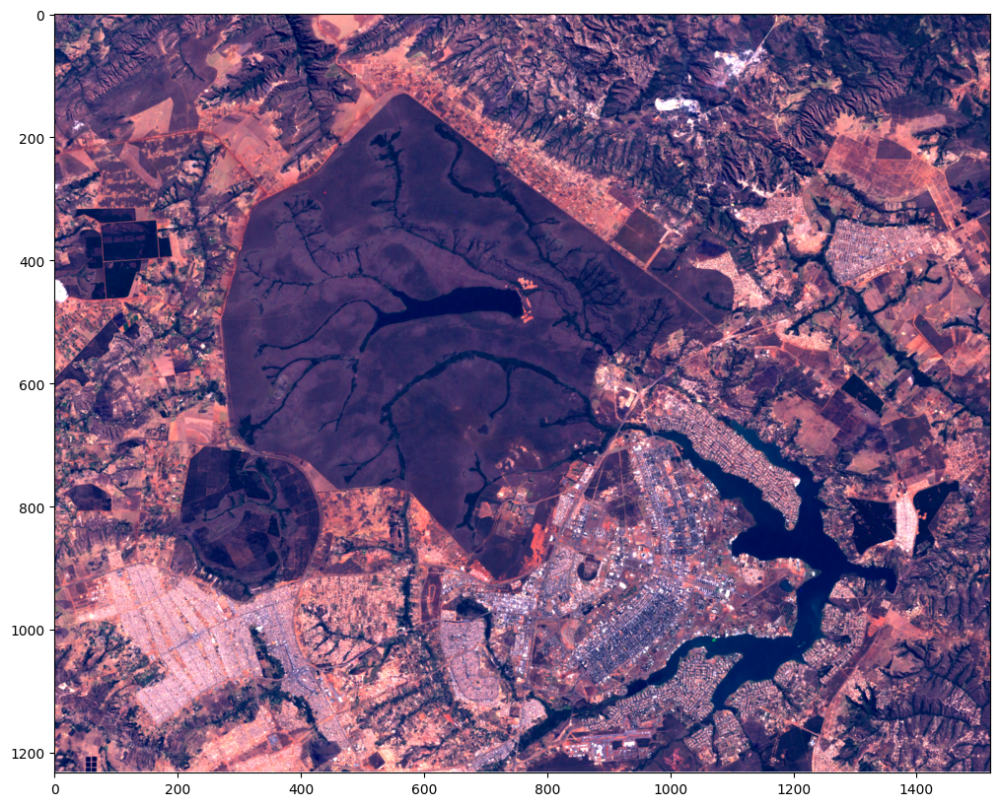

In [ ]:
# Matplotlib
plt.imshow(expansao(np.dstack([img[:,:,2],img[:,:,1],img[:,:,0]]), y=1))

/usr/local/lib/python3.10/dist-packages/spectral/graphics/spypylab.py:796: UserWarning: Failed to create RectangleSelector object. Interactive pixel class labeling will be unavailable.
  warnings.warn(msg)


ImageView object:
  Display bands       :  (2, 1, 3)
  Interpolation       :  <default>
  RGB data limits     :
    R: [27.0, 99.0]
    G: [36.0, 75.0]
    B: [15.0, 97.0]

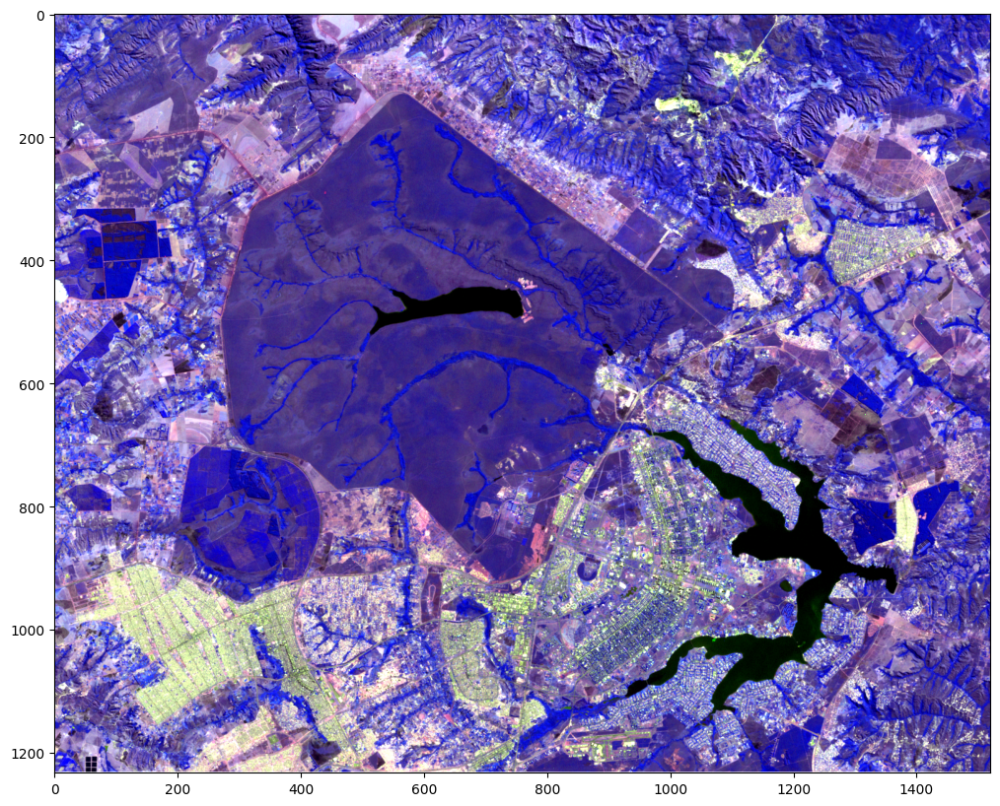

In [ ]:
# Spectral
imshow(img, (2,1,3), stretch=(0.02,0.98))

In [ ]:
CIR

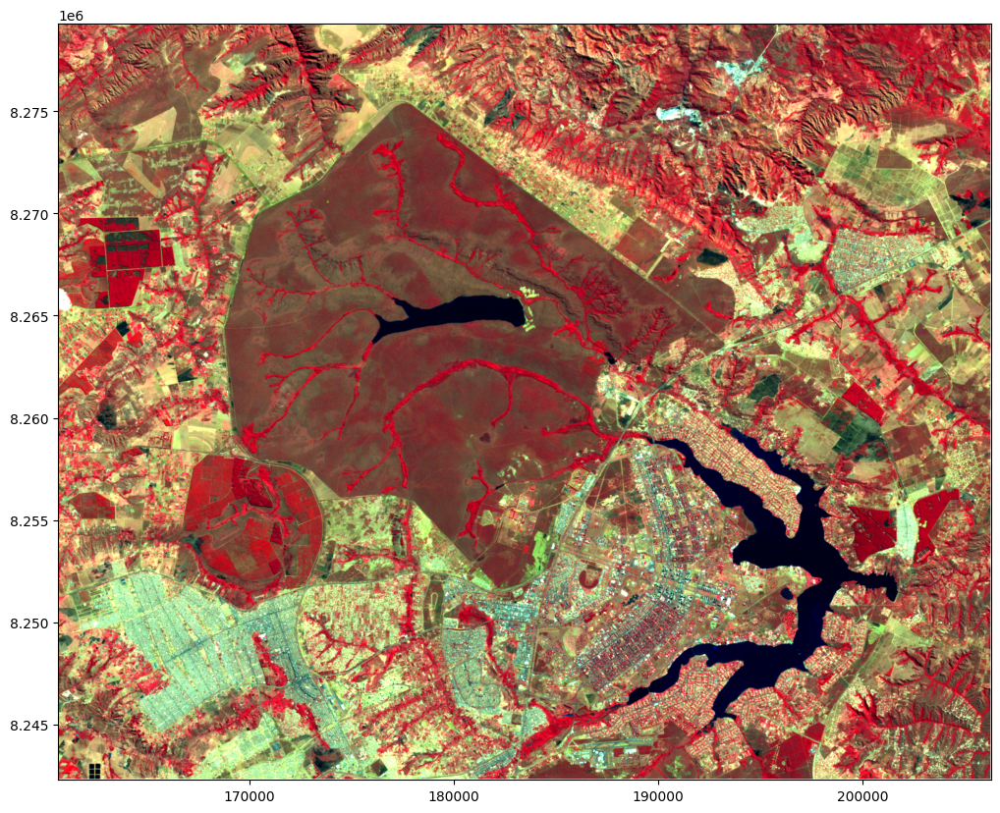

<Axes: >

In [ ]:
# Rasterio
show(expansao(src.read([4, 3, 2])), transform=src.transform, adjust=True)

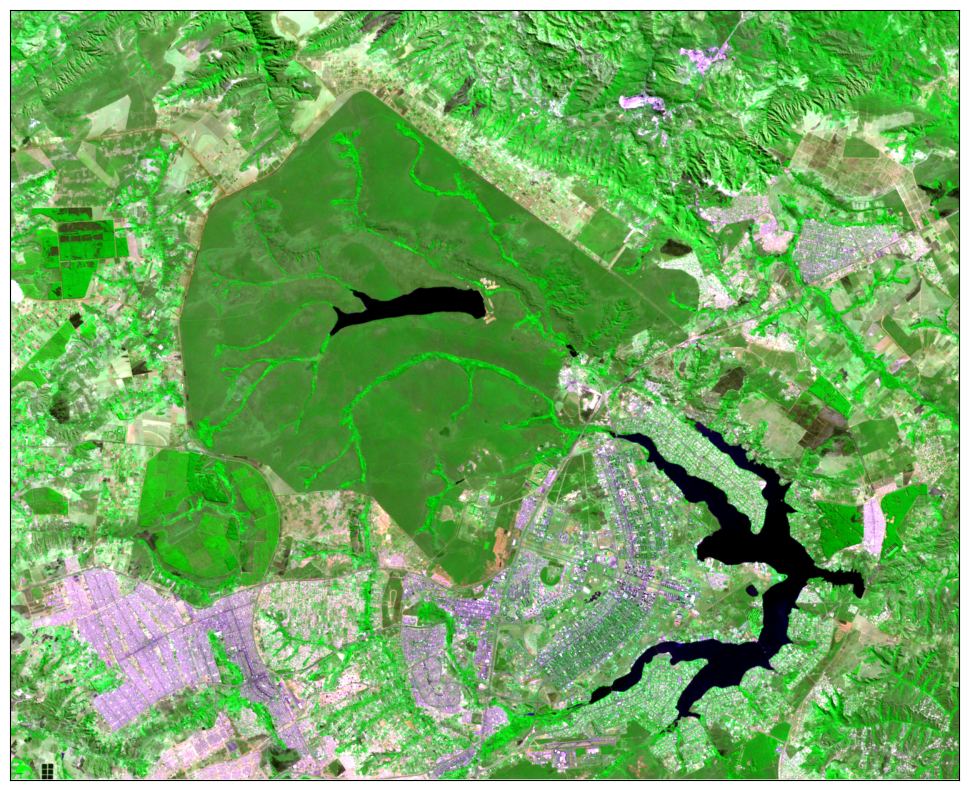

<Axes: >

In [ ]:
# Earthpy
ep.plot_rgb(dataset,rgb= (2,3,1), stretch=True, figsize=(15,10))